<div style="width: 100%; clear: both;">
<div style="float: left; width: 50%;">
<img src="http://www.uoc.edu/portal/_resources/common/imatges/marca_UOC/UOC_Masterbrand.jpg" align="left">
</div>
</div>
<div style="float: right; width: 50%;">
<p style="margin: 0; padding-top: 22px; text-align:right;">Trabajo Final de Master</p>
<p style="margin: 0; text-align:right;">20241 - Máster universitario en Ciencias de datos (<i>Data science</i>)</p>
<p style="margin: 0; text-align:right; padding-button: 100px;">Estudios de Informática, Multimedia y Telecomunicaciones</p>
</div>
</div>
<div style="width: 100%; clear: both;">
<div style="width:100%;">&nbsp;</div>

<div class="alert alert-block alert-info">
    <strong>Nombre y apellidos:</strong> Oscar Javier Vásquez Casallas
</div>

# 🧠 Análisis y Predicción de Redes de Colaboración en AGROSAVIA

Este cuaderno de trabajo contiene el desarrollo completo del flujo de análisis de datos correspondiente al proyecto:  
**"Análisis y predicción de redes de colaboración con aliados estratégicos en la Corporación Colombiana de Investigación Agropecuaria – AGROSAVIA."**

El objetivo principal de este proyecto es mapear, analizar y predecir interacciones entre actores institucionales e investigadores, a partir de información estructurada sobre convenios, alianzas, unidades organizacionales y aliados nacionales e internacionales.

Este notebook integra de forma secuencial y documentada las siguientes fases del pipeline de ciencia de datos:

1. **Carga y exploración inicial del dataset maestro.**  
2. **Limpieza estructural, normalización y validación de integridad.**  
3. **Transformación y preparación de datos para análisis de redes.**  
4. **Construcción de nodos y aristas a partir de relaciones institucionales.**  
5. **Análisis exploratorio de redes mediante métricas estructurales.**  
6. **Visualización interactiva y representación gráfica de grafos.**  
7.  **Diseño y prueba de modelos predictivos para identificar nuevas colaboraciones.**

El desarrollo se realiza en **Python**, empleando bibliotecas como `pandas`, `networkx`, `matplotlib`, `unidecode` y otras que serán cargadas en las secciones correspondientes.  
Todo el código ha sido estructurado para garantizar reproducibilidad, escalabilidad y trazabilidad en el manejo de los datos.


 **1. Carga y exploración inicial del dataset maestro.**

In [1]:
# Instalación de las Librerías básicas
!pip install unidecode
!pip install pyvis
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import unidecode
import community.community_louvain as community_louvain
from sklearn.metrics.pairwise import cosine_similarity

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.8/235.8 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 35.6 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [3]:
import pandas as pd
# Se cambia el directorio donde se encuentra el archivo .csv
import os
os.chdir('/content/drive/MyDrive/Colab Notebooks/')

# Se Cargan los datos del archivo CSV
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset_alianzas_agrosavia.csv')



In [4]:
# Se visuaaliza el número de filas y columnas
print("Dimensiones del dataset:", df.shape)

# Se visualizan los nombres de columnas
print("Columnas:", df.columns.tolist())

Dimensiones del dataset: (9464, 22)
Columnas: ['ali_id', 'tipali_id', 'ali_nombre', 'tipobj_id', 'medver_id', 'estcon_id', 'ali_fecini', 'ali_fecfin', 'ali_observacion', 'tipali_desc', 'tipobj_desc', 'medver_desc', 'estacon_desc', 'aliuniorg_id', 'uniorg_id', 'uniorg_nombre', 'tipuniorg_desc', 'pais_id', 'pais_desc', 'tipfuefin_desc', 'tipuniorg_id', 'tipfuefin_id']


In [5]:
# Se visualizan las primeras 5 filas
df.head()

# Se visualizan las últimas 5 filas
df.tail()

,ali_id,tipali_id,ali_nombre,tipobj_id,medver_id,estcon_id,ali_fecini,ali_fecfin,ali_observacion,tipali_desc,...,estacon_desc,aliuniorg_id,uniorg_id,uniorg_nombre,tipuniorg_desc,pais_id,pais_desc,tipfuefin_desc,tipuniorg_id,tipfuefin_id
9459,6945,3,"Actualización teórico práctica en:""ENSAYOS DE ...",8,12,2,2016-06-24 00:00:00,2016-08-24 00:00:00,grupo Investigación en erosión hídrica y eólic...,Espacio para la construcción de Alianzas,...,Finalizado,39030,1066,Instituto Nacional de Tecnología Agropecuaria ...,Universidades,9,Argentina,(Investigación),6,2.0
9460,6913,3,Tercer Taller para los investigadores de la RE...,8,12,2,2023-11-27 00:00:00,2023-12-01 00:00:00,Metodologías para la estimación de consumo com...,Espacio para la construcción de Alianzas,...,Finalizado,39031,1059,Instituto Nacional de Investigación Agropecuar...,Universidades,186,Uruguay,NaN,6,NaN
9461,6714,3,Misión técnica Feria de Alimentos y Bebidas de...,8,12,2,2023-03-16 00:00:00,2023-03-19 00:00:00,1. Alianzas con las empresas. Con las empresas...,Espacio para la construcción de Alianzas,...,Finalizado,39667,5599,Embajada de Colombia en China,Entidad Pública del Orden Nacional,42,Colombia,Convenio Específico,1,8.0
9462,6717,3,VI Congreso Colombiano de Zoología,8,12,2,2023-03-27 00:00:00,2023-03-31 00:00:00,Manejo y control de hongos en colecciones ento...,Espacio para la construcción de Alianzas,...,Finalizado,39668,5361,Universidad Nacional de Asunción,Universidades,138,Paraguay,Convenio Específico,6,8.0
9463,6852,3,Un enfoque moderno para la seguridad alimentar...,8,12,2,2023-10-02 00:00:00,2023-10-06 00:00:00,"Como cierre del curso, se organizaron grupos d...",Espacio para la construcción de Alianzas,...,Finalizado,39669,5547,Centro Nacional de Tecnología Agropecuaria y F...,Organismo Internacional,54,El Salvador,NaN,4,NaN


In [6]:
# Se obtienen los tipos de datos por columna
df.dtypes

,0
ali_id,int64
tipali_id,int64
ali_nombre,object
tipobj_id,int64
medver_id,int64
estcon_id,int64
ali_fecini,object
ali_fecfin,object
ali_observacion,object
tipali_desc,object


In [7]:
# Se realiza el conteo de valores nulos por columna
df.isnull().sum()

,0
ali_id,0
tipali_id,0
ali_nombre,4
tipobj_id,0
medver_id,0
estcon_id,0
ali_fecini,0
ali_fecfin,0
ali_observacion,1
tipali_desc,0


In [8]:
# Se cuentan los valores únicos por columna categórica
columnas_categoricas = ['tipali_desc','tipobj_desc', 'medver_desc', 'estacon_desc', 'pais_desc','tipuniorg_desc','tipfuefin_desc']
for col in columnas_categoricas:
    print(f"\nValores únicos en {col}:")
    print(df[col].value_counts())


Valores únicos en tipali_desc:
tipali_desc
Vinculo negocial                            4404
Gestión de conocimiento                     3097
Espacio para la construcción de Alianzas    1963
Name: count, dtype: int64

Valores únicos en tipobj_desc:
tipobj_desc
SIM                     4404
Actividades de I+D+I    3097
Eventos                 1963
Name: count, dtype: int64

Valores únicos en medver_desc:
medver_desc
Convenio específico    4404
Articulo publico       3097
Informe del evento     1963
Name: count, dtype: int64

Valores únicos en estacon_desc:
estacon_desc
Finalizado    7309
Liquidado     1612
Vigente        543
Name: count, dtype: int64

Valores únicos en pais_desc:
pais_desc
Colombia                           6190
Estados Unidos                      552
Brasil                              532
Costa Rica                          245
México                              215
                                   ... 
República Democrática del Congo       1
Grecia                 

In [9]:
# Se verifica cuántos duplicados exactos hay
duplicados_totales = df.duplicated().sum()
print(f"Duplicados exactos: {duplicados_totales}")

if duplicados_totales > 0:
    display(df[df.duplicated()].head())

Duplicados exactos: 0


In [10]:
# Número de alianzas únicas
print("Alianzas únicas:", df['ali_id'].nunique())

# Número de unidades organizacionales únicas
print("Unidades organizacionales únicas:", df['uniorg_id'].nunique())

# Número de combinaciones únicas alianza-unidad
print("Relaciones alianza-unidad únicas:", df[['ali_id', 'uniorg_id']].drop_duplicates().shape[0])

Alianzas únicas: 5972
Unidades organizacionales únicas: 1896
Relaciones alianza-unidad únicas: 9464


In [11]:
# Ver distribución temporal
# Se convierten las fechas si no están en formato datetime
df['ali_fecini'] = pd.to_datetime(df['ali_fecini'], errors='coerce')
df['ali_fecfin'] = pd.to_datetime(df['ali_fecfin'], errors='coerce')

# Se visializa el rango de fechas
print("Rango de fechas de alianzas:")
print(df['ali_fecini'].min(), "→", df['ali_fecfin'].max())

Rango de fechas de alianzas:
1992-11-04 00:00:00 → 2042-11-30 00:00:00


**2. Limpieza estructural, normalización y validación de integridad.**  

In [12]:
# Se seleccionan columnas con valores nulos
columnas_nulas = ['ali_nombre', 'ali_observacion']

# Se revisan valores nulos en esas columnas
print(df[columnas_nulas].isnull().sum())

display(df[df['ali_nombre'].isnull()].head())
display(df[df['ali_observacion'].isnull()].head())


ali_nombre         4
ali_observacion    1
dtype: int64


,ali_id,tipali_id,ali_nombre,tipobj_id,medver_id,estcon_id,ali_fecini,ali_fecfin,ali_observacion,tipali_desc,...,estacon_desc,aliuniorg_id,uniorg_id,uniorg_nombre,tipuniorg_desc,pais_id,pais_desc,tipfuefin_desc,tipuniorg_id,tipfuefin_id
7,437,1,NaN,4,11,2,2018-01-01,2018-01-01,Publicación artículo científico,Gestión de conocimiento,...,Finalizado,26670,6,Instituto Colombiano Agropecuario ICA,Entidad Pública del Orden Nacional,42,Colombia,NaN,1,NaN
616,889,1,NaN,4,11,2,2013-01-01,2013-01-01,Publicación artículo científico,Gestión de conocimiento,...,Finalizado,27282,209,Universidad Nacional de Colombia,Universidades,42,Colombia,NaN,6,NaN
994,919,1,NaN,4,11,2,2013-01-01,2013-01-01,Publicación artículo científico,Gestión de conocimiento,...,Finalizado,27660,353,Universidad de Pamplona,Universidades,42,Colombia,NaN,6,NaN
2585,437,1,NaN,4,11,2,2018-01-01,2018-01-01,Publicación artículo científico,Gestión de conocimiento,...,Finalizado,29263,5221,Plant Protection Institute of Hungarian Academ...,Organismo Internacional,80,Hungría,NaN,4,NaN


,ali_id,tipali_id,ali_nombre,tipobj_id,medver_id,estcon_id,ali_fecini,ali_fecfin,ali_observacion,tipali_desc,...,estacon_desc,aliuniorg_id,uniorg_id,uniorg_nombre,tipuniorg_desc,pais_id,pais_desc,tipfuefin_desc,tipuniorg_id,tipfuefin_id
7619,6089,3,Nutrición y Manejo de suelos en Cacao,8,12,2,2017-05-12,2017-05-12,NaN,Espacio para la construcción de Alianzas,...,Finalizado,39458,5515,International Plant Nutrition Institute,Organismo Internacional,35,Canadá,(Investigación),4,2.0


In [13]:
# Se rellenan nulos con texto estándar
df['ali_nombre'] = df['ali_nombre'].fillna('sin nombre')
df['ali_observacion'] = df['ali_observacion'].fillna('sin observacion')

In [14]:
# Se visualizan si las columnas de fecha ya son tipo datetime
print(df['ali_fecini'].dtype, df['ali_fecfin'].dtype)

try:
    df['ali_fecini_tmp'] = pd.to_datetime(df['ali_fecini'], errors='coerce')
    df['ali_fecfin_tmp'] = pd.to_datetime(df['ali_fecfin'], errors='coerce')

    print("Fechas de inicio inválidas:", df['ali_fecini_tmp'].isna().sum())
    print("Fechas de fin inválidas:", df['ali_fecfin_tmp'].isna().sum())

except Exception as e:
    print("Error al convertir fechas:", e)

datetime64[ns] datetime64[ns]
Fechas de inicio inválidas: 0
Fechas de fin inválidas: 0


In [15]:
# Se asegura de tener las fechas en formato datetime
df['ali_fecini'] = pd.to_datetime(df['ali_fecini'], errors='coerce')
df['ali_fecfin'] = pd.to_datetime(df['ali_fecfin'], errors='coerce')

# Se visualizan los registros donde la fecha de fin es anterior a la de inicio
fechas_invalidas = df[df['ali_fecfin'] < df['ali_fecini']]
print(f"Registros con fechas inconsistentes: {len(fechas_invalidas)}")

display(fechas_invalidas[['ali_id', 'ali_nombre', 'ali_fecini', 'ali_fecfin']].head())

Registros con fechas inconsistentes: 2


,ali_id,ali_nombre,ali_fecini,ali_fecfin
3917,2352,Resúmenes analíticos de la investigación de cí...,2003-09-05,2003-03-04
4306,3105,Seguir con el proyecto de validación en fincas...,2008-09-17,2008-05-16


In [16]:
# Se seleccionan las columnas que deberían contener texto bien formateado
columnas_texto = [
    'ali_nombre', 'ali_observacion', 'tipali_desc', 'tipobj_desc',
    'medver_desc', 'estacon_desc', 'uniorg_nombre', 'tipuniorg_desc', 'pais_desc'
]

In [17]:
import unidecode
# Se limpian todas las columnas textuales
for col in columnas_texto:
    if col in df.columns:
        df[col] = df[col].astype(str) \
                         .str.strip() \
                         .str.lower() \
                         .apply(unidecode.unidecode)

In [18]:
#Verificar que las claves primarias no estén duplicadas
# Se obtiene el Número de alianzas únicas vs registros
alianzas_unicas = df['ali_id'].nunique()
registros_totales = len(df)
print(f"Total de registros: {registros_totales}")
print(f"Alianzas únicas: {alianzas_unicas}")

# Se visualiza si hay duplicados exactos de ali_id
duplicados_ali_id = df[df.duplicated(subset=['ali_id'], keep=False)]
display(duplicados_ali_id.head())

Total de registros: 9464
Alianzas únicas: 5972


,ali_id,tipali_id,ali_nombre,tipobj_id,medver_id,estcon_id,ali_fecini,ali_fecfin,ali_observacion,tipali_desc,...,uniorg_id,uniorg_nombre,tipuniorg_desc,pais_id,pais_desc,tipfuefin_desc,tipuniorg_id,tipfuefin_id,ali_fecini_tmp,ali_fecfin_tmp
0,2078,1,a review of the knowledge base for the develop...,4,11,2,2023-01-01,2023-01-01,publicacion articulo cientifico,gestion de conocimiento,...,4,ministerio de ciencia tecnologia e innovacion ...,entidad publica del orden nacional,42,colombia,NaN,1,NaN,2023-01-01,2023-01-01
2,192,1,studies on the genus ripersiella tinsley (hemi...,4,11,2,2020-01-01,2020-01-01,publicacion articulo cientifico,gestion de conocimiento,...,6,instituto colombiano agropecuario ica,entidad publica del orden nacional,42,colombia,NaN,1,NaN,2020-01-01,2020-01-01
4,341,1,investigations on the genus rhizoecus (hemipte...,4,11,2,2019-01-01,2019-01-01,publicacion articulo cientifico,gestion de conocimiento,...,6,instituto colombiano agropecuario ica,entidad publica del orden nacional,42,colombia,NaN,1,NaN,2019-01-01,2019-01-01
5,397,1,virus-tested plant material in colombia - an a...,4,11,2,2018-01-01,2018-01-01,publicacion articulo cientifico,gestion de conocimiento,...,6,instituto colombiano agropecuario ica,entidad publica del orden nacional,42,colombia,NaN,1,NaN,2018-01-01,2018-01-01
6,431,1,the genus coccidella hambleton (hemiptera: rhi...,4,11,2,2018-01-01,2018-01-01,publicacion articulo cientifico,gestion de conocimiento,...,6,instituto colombiano agropecuario ica,entidad publica del orden nacional,42,colombia,NaN,1,NaN,2018-01-01,2018-01-01


In [19]:
# Se validad duplicados en relaciones alianza-unidad
duplicados_ali_uniorg = df[df.duplicated(subset=['ali_id', 'uniorg_id'], keep=False)]
print(f"Relaciones alianza-unidad duplicadas: {len(duplicados_ali_uniorg)}")

Relaciones alianza-unidad duplicadas: 0


In [20]:
# Se revisan valores nulos en campos de claves foráneas
claves_foraneas = ['ali_id', 'uniorg_id']
for col in claves_foraneas:
    print(f"Valores nulos en {col}: {df[col].isnull().sum()}")

Valores nulos en ali_id: 0
Valores nulos en uniorg_id: 0


In [21]:
# Se valida la unicidad entre ID y descripción
validacion_tipali = df[['tipali_id', 'tipali_desc']].drop_duplicates()
conflictos_tipali = validacion_tipali['tipali_id'].duplicated(keep=False).sum()
print(f"Posibles conflictos en tipali_id con descripciones diferentes: {conflictos_tipali}")
validacion_tipobj = df[['tipobj_id', 'tipobj_desc']].drop_duplicates()
conflictos_tipobj = validacion_tipobj['tipobj_id'].duplicated(keep=False).sum()
print(f"Posibles conflictos en tipobj_id con descripciones diferentes: {conflictos_tipobj}")
validacion_medver = df[['medver_id', 'medver_desc']].drop_duplicates()
conflictos_medver = validacion_medver['medver_id'].duplicated(keep=False).sum()
print(f"Posibles conflictos en medver_id con descripciones diferentes: {conflictos_medver}")
validacion_estacon = df[['estcon_id', 'estacon_desc']].drop_duplicates()
conflictos_estacon = validacion_estacon['estcon_id'].duplicated(keep=False).sum()
print(f"Posibles conflictos en estacon_id con descripciones diferentes: {conflictos_estacon}")
validacion_pais = df[['pais_id', 'pais_desc']].drop_duplicates()
conflictos_pais = validacion_pais['pais_id'].duplicated(keep=False).sum()
print(f"Posibles conflictos en pais_id con descripciones diferentes: {conflictos_pais}")
validacion_tipuniorg = df[['tipuniorg_id', 'tipuniorg_desc']].drop_duplicates()
conflictos_tipuniorg = validacion_tipuniorg['tipuniorg_id'].duplicated(keep=False).sum()
print(f"Posibles conflictos en tipuniorg_id con descripciones diferentes: {conflictos_tipuniorg}")
validacion_tipfuefin = df[['tipfuefin_id', 'tipfuefin_desc']].drop_duplicates()
conflictos_tipfuefin = validacion_tipfuefin['tipfuefin_id'].duplicated(keep=False).sum()
print(f"Posibles conflictos en tipfuefin_id con descripciones diferentes: {conflictos_tipfuefin}")

Posibles conflictos en tipali_id con descripciones diferentes: 0
Posibles conflictos en tipobj_id con descripciones diferentes: 0
Posibles conflictos en medver_id con descripciones diferentes: 0
Posibles conflictos en estacon_id con descripciones diferentes: 0
Posibles conflictos en pais_id con descripciones diferentes: 0
Posibles conflictos en tipuniorg_id con descripciones diferentes: 0
Posibles conflictos en tipfuefin_id con descripciones diferentes: 0


In [22]:
# Guardar versión limpia para etapas siguientes
ruta_limpio = "dataset_alianzas_agrosavia_limpio.csv"
df.to_csv(ruta_limpio, index=False)

**3. Transformación y preparación de datos para análisis de redes.**  

In [23]:
# Se crea columna de duración de las alianzas (en días)
df['duracion_dias'] = (df['ali_fecfin'] - df['ali_fecini']).dt.days

In [24]:
# Se convierten a string y remover espacios
df['ali_id'] = df['ali_id'].astype(str).str.strip()
df['uniorg_id'] = df['uniorg_id'].astype(str).str.strip()

In [25]:
# Se convierten los campos categóricos a categorías
categoricas = ['tipobj_desc', 'medver_desc', 'estacon_desc', 'tipuniorg_desc', 'pais_desc','tipali_desc','tipfuefin_desc']
for col in categoricas:
    df[col] = df[col].astype('category')

In [26]:
# Se crea columans separadas de año de inicio y fin
df['anio_inicio'] = df['ali_fecini'].dt.year
df['anio_fin'] = df['ali_fecfin'].dt.year

In [27]:
# Se crea el número de aliados o unidades por alianza
unidades_por_alianza = df.groupby('ali_id')['uniorg_id'].nunique().reset_index(name='n_unidades')
df = df.merge(unidades_por_alianza, on='ali_id', how='left')

**4. Construcción de nodos y aristas a partir de relaciones institucionales.**  

In [28]:
# Se crean los nodos tomamdo como base las unidades organizacionales
nodos = df[['uniorg_id', 'uniorg_nombre', 'tipuniorg_desc', 'pais_desc']].drop_duplicates()
nodos = nodos.rename(columns={
    'uniorg_id': 'node_id',
    'uniorg_nombre': 'label',
    'tipuniorg_desc': 'tipo',
    'pais_desc': 'pais'
})
print("Total de nodos únicos:", nodos.shape[0])

Total de nodos únicos: 1896


In [29]:
# Se crean las aristas tomamdo como base la relación entre alianza y unidad organizacional
from itertools import combinations

edges = []

# Se agrupan por alianza y generar pares únicos de co-participantes
for ali_id, grupo in df.groupby('ali_id'):
    participantes = grupo['uniorg_id'].dropna().unique()
    if len(participantes) > 1:
        for source, target in combinations(sorted(participantes), 2):
            edges.append((source, target, ali_id))

In [30]:
# Se crear el DataFrame de aristas
aristas = pd.DataFrame(edges, columns=['source', 'target', 'ali_id'])

# Se calcular el número de veces que cada par colaboró (peso)
aristas_pesadas = aristas.groupby(['source', 'target']).size().reset_index(name='weight')

print("Total de aristas:", len(aristas_pesadas))

Total de aristas: 6761


In [31]:
# Se generan archivos para nodos y aristas
nodos.to_csv("nodos_red_colaboracion_coactores.csv", index=False)
aristas_pesadas.to_csv("aristas_red_colaboracion_coactores.csv", index=False)

**5. Análisis exploratorio de redes mediante métricas estructurales.**

In [32]:
# Se cargan nodos y aristas

nodos = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/nodos_red_colaboracion_coactores.csv")
aristas = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/aristas_red_colaboracion_coactores.csv")

In [33]:
# Se crea el grafo
G = nx.Graph()

# Se agregan los nodos
for _, row in nodos.iterrows():
    G.add_node(row['node_id'], label=row['label'], tipo=row['tipo'], pais=row['pais'])

# Se agregan aristas con peso
for _, row in aristas.iterrows():
    G.add_edge(row['source'], row['target'], weight=row['weight'])


# Se filtran actores más relevantes por grado
# Se calcula el grado
grado = dict(G.degree())

# Se establecer el umbral mínimo de conexiones
umbral_grado = 10

# Se filtran nodos con grado mayor o igual al umbral
nodos_filtrados = [n for n, g in grado.items() if g >= umbral_grado]

# Se crear el subgrafo
G_filtrado = G.subgraph(nodos_filtrados).copy()

print(f"Nodos visibles: {G_filtrado.number_of_nodes()}")
print(f"Aristas visibles: {G_filtrado.number_of_edges()}")

Nodos visibles: 372
Aristas visibles: 3722


In [34]:
# Análisis de métricas en el grafo filtrado
print("Grado promedio:", sum(dict(G_filtrado.degree()).values()) / G_filtrado.number_of_nodes())

# Se calcula el grado
grado = dict(G_filtrado.degree())

# Se calcula Centralidad de intermediación (betweenness)
betweenness = nx.betweenness_centrality(G_filtrado, normalized=True)

# Se calcula Centralidad de cercanía (closeness)
closeness = nx.closeness_centrality(G_filtrado)

# Se agrupa en un DataFrame para análisis
df_metricas = pd.DataFrame({
    "node_id": list(grado.keys()),
    "grado": list(grado.values()),
    "betweenness": list(betweenness.values()),
    "closeness": list(closeness.values()),
    "nombre": [G_filtrado.nodes[n]['label'] for n in G_filtrado.nodes()],
    "tipo": [G_filtrado.nodes[n]['tipo'] for n in G_filtrado.nodes()],
    "pais": [G_filtrado.nodes[n]['pais'] for n in G_filtrado.nodes()]
})

# Se muestran los 10 nodos más relevantes por grado
print("Top 10 por grado:")
display(df_metricas.sort_values(by="grado", ascending=False).head(10))

# Se muestran los 10 nodos más relevantes por betweenness
print("\nTop 10 por betweenness centrality:")
display(df_metricas.sort_values(by="betweenness", ascending=False).head(10))

# Se muestran los 10 nodos más relevantes por closennes
print("\nTop 10 por betweenness centrality:")
display(df_metricas.sort_values(by="betweenness", ascending=False).head(10))

Grado promedio: 20.010752688172044
Top 10 por grado:


,node_id,grado,betweenness,closeness,nombre,tipo,pais
42,209,160,0.185354,0.634188,universidad nacional de colombia,universidades,colombia
6,15,138,0.144999,0.611203,centro internacional de agricultura tropical,entidad publica del orden nacional,colombia
177,795,100,0.058184,0.542398,"wageningen university, holanda",universidades,paises bajos
3,8,92,0.055170,0.563830,empresa brasileira de pesquisa agropecuaria em...,organismo internacional,brasil
276,5316,84,0.040151,0.530000,universidad de la republica,universidades,uruguay
15,62,84,0.033244,0.535354,universidad de antioquia,universidades,colombia
232,1066,83,0.029429,0.537681,instituto nacional de tecnologia agropecuaria ...,universidades,argentina
174,788,80,0.048201,0.524011,university of california,universidades,estados unidos
126,2659,71,0.014748,0.504076,universidade do sao paulo brasil usp,universidades,brasil
8,17,70,0.094058,0.519608,instituto interamericano de cooperacion para l...,organismo internacional,costa rica



Top 10 por betweenness centrality:


,node_id,grado,betweenness,closeness,nombre,tipo,pais
42,209,160,0.185354,0.634188,universidad nacional de colombia,universidades,colombia
6,15,138,0.144999,0.611203,centro internacional de agricultura tropical,entidad publica del orden nacional,colombia
8,17,70,0.094058,0.519608,instituto interamericano de cooperacion para l...,organismo internacional,costa rica
114,555,66,0.089223,0.533813,universidad de los andes,universidades,colombia
177,795,100,0.058184,0.542398,"wageningen university, holanda",universidades,paises bajos
3,8,92,0.055170,0.563830,empresa brasileira de pesquisa agropecuaria em...,organismo internacional,brasil
174,788,80,0.048201,0.524011,university of california,universidades,estados unidos
276,5316,84,0.040151,0.530000,universidad de la republica,universidades,uruguay
15,62,84,0.033244,0.535354,universidad de antioquia,universidades,colombia
50,4336,67,0.032725,0.515278,universidade estadual paulista,universidades,brasil



Top 10 por betweenness centrality:


,node_id,grado,betweenness,closeness,nombre,tipo,pais
42,209,160,0.185354,0.634188,universidad nacional de colombia,universidades,colombia
6,15,138,0.144999,0.611203,centro internacional de agricultura tropical,entidad publica del orden nacional,colombia
8,17,70,0.094058,0.519608,instituto interamericano de cooperacion para l...,organismo internacional,costa rica
114,555,66,0.089223,0.533813,universidad de los andes,universidades,colombia
177,795,100,0.058184,0.542398,"wageningen university, holanda",universidades,paises bajos
3,8,92,0.055170,0.563830,empresa brasileira de pesquisa agropecuaria em...,organismo internacional,brasil
174,788,80,0.048201,0.524011,university of california,universidades,estados unidos
276,5316,84,0.040151,0.530000,universidad de la republica,universidades,uruguay
15,62,84,0.033244,0.535354,universidad de antioquia,universidades,colombia
50,4336,67,0.032725,0.515278,universidade estadual paulista,universidades,brasil


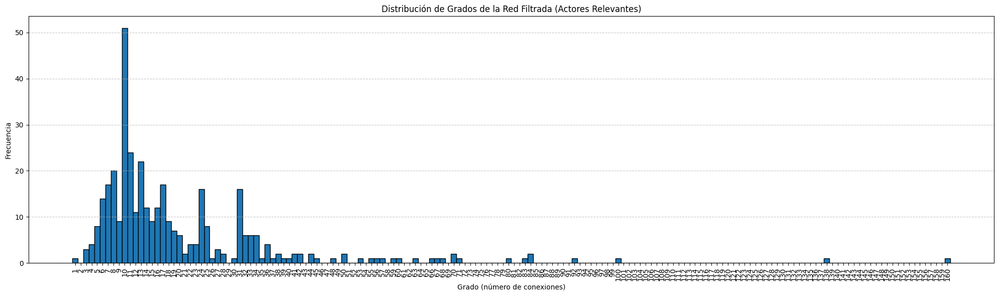

In [35]:
# Se calculan los grados de los nodos del grafo filtrado
grados = [G_filtrado.degree(n) for n in G_filtrado.nodes()]

# Se crea un histograma
plt.figure(figsize=(20, 6))
plt.hist(grados, bins=range(min(grados), max(grados) + 2), edgecolor='black', align='left')
plt.title("Distribución de Grados de la Red Filtrada (Actores Relevantes)")
plt.xlabel("Grado (número de conexiones)")
plt.ylabel("Frecuencia")
plt.xticks(range(min(grados), max(grados) + 1), rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

**6. Visualización interactiva y representación gráfica de grafos.**

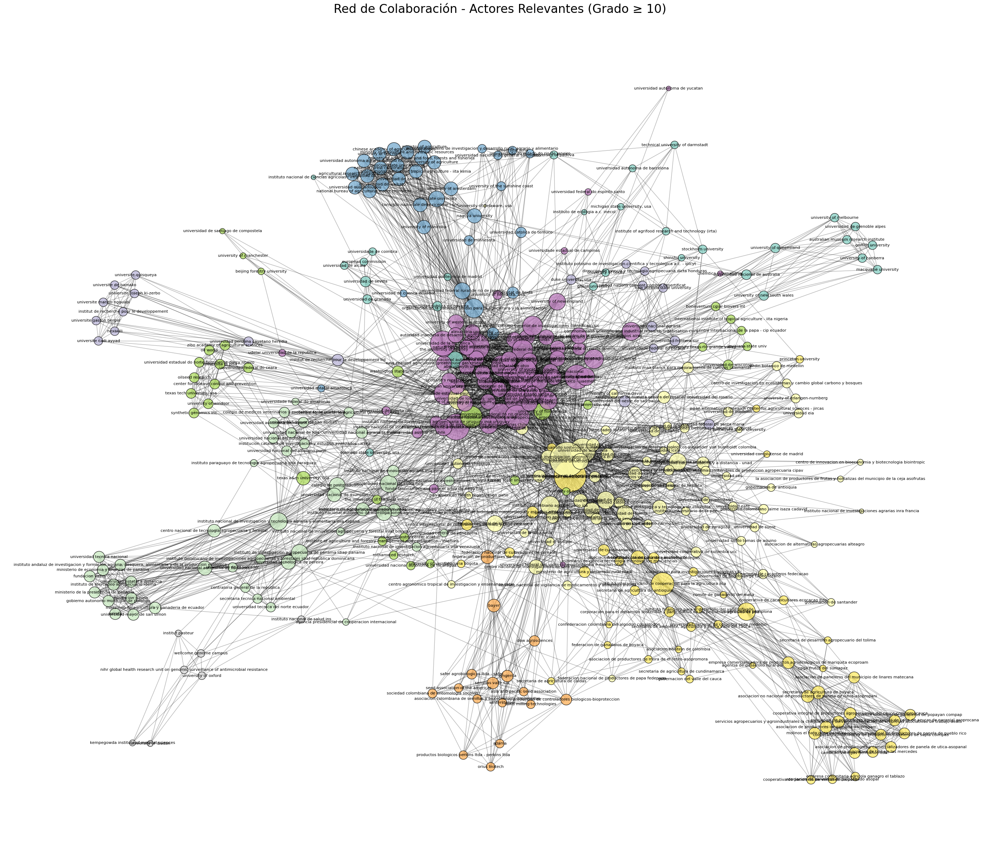

In [36]:
# Se detecta comunidades con Louvain (opcional)

partition = community_louvain.best_partition(G_filtrado)
nx.set_node_attributes(G_filtrado, partition, 'comunidad')

# Se visualiza del grafo filtrado

# Layout de visualización
pos = nx.spring_layout(G_filtrado, k=0.2, seed=42)

# Tamaño según grado
tamano = [G_filtrado.degree(n) * 30 for n in G_filtrado.nodes()]

# Color por comunidad
colores = [partition[n] for n in G_filtrado.nodes()]

plt.figure(figsize=(28, 24))
nx.draw_networkx_nodes(G_filtrado, pos, node_color=colores, cmap=plt.cm.Set3,
                       node_size=tamano, alpha=0.8, edgecolors='black')
nx.draw_networkx_edges(G_filtrado, pos, alpha=0.3)
nx.draw_networkx_labels(G_filtrado, pos, labels=nx.get_node_attributes(G_filtrado, "label"), font_size=8)

plt.title("Red de Colaboración - Actores Relevantes (Grado ≥ " + str(umbral_grado) + ")", fontsize=24)
plt.axis('off')
plt.tight_layout()
plt.show()

**Visualización interactiva con pyvis**

In [37]:
# Se importan las librerias necesarias
from pyvis.network import Network
from google.colab import files
from IPython.display import display, HTML

# Se crear la visualización con pyvis
net = Network(notebook=True, cdn_resources='in_line')

G_filtrado_str = nx.Graph()
for u, v, data in G_filtrado.edges(data=True):
    G_filtrado_str.add_edge(str(u), str(v), **{k: str(v) if isinstance(v, np.int64) else v for k, v in data.items()}) # Convert int64 values in edge data to string
for node, data in G_filtrado.nodes(data=True):
    G_filtrado_str.add_node(str(node), **{k: str(v) if isinstance(v, np.int64) else v for k, v in data.items()}) # Convert int64 values in node data to string

net.from_nx(G_filtrado_str) # Passing modified graph with string node IDs

# Configuración de físicas
net.toggle_physics(False)
net.show_buttons(filter_=['physics'])

# Se guarda la visualización en un archivo HTML
net.save_graph("aliados_network.html")

# Se muestra el archivo HTML en la celda de Colab
display(HTML("aliados_network.html"))


 **3.	Visualización automática del subgrafo filtrado e interfaz interactiva con ipywidgets**

In [38]:
# Se crea el diccionario de etiquetas
etiquetas_dict = df[['uniorg_id', 'uniorg_nombre']].drop_duplicates().set_index('uniorg_id')['uniorg_nombre'].to_dict()

# Se asigna el atributo 'label' a los nodos del grafo original
nx.set_node_attributes(G, etiquetas_dict, name='label')

In [39]:
# Se visualizan los primeros 5 nodos con sus atributos
for n, d in list(G.nodes(data=True))[:5]:
    print(n, '→', d.get('label'))

4 → ministerio de ciencia tecnologia e innovacion minciencias
6 → instituto colombiano agropecuario ica
8 → empresa brasileira de pesquisa agropecuaria embrapa
13 → instituto internacional para los recursos fitogeneticos ipgri
14 → centro internacional de mejoramiento de maiz y trigo cimmyt


In [40]:
from ipywidgets import interact, IntSlider, Dropdown, Checkbox
# Se crea la función para la visualiazación interactiva
def filtrar_y_visualizar_red(df, G, grado_minimo=1, peso_minimo=1, comunidad=None,
                              usar_comunidades=False, anio=None, tipali=None,
                              estacon=None, tipuniorg=None, mostrar=True):
    """
    Filtra y visualiza una red en base a grado, peso, comunidad, año y otros filtros temáticos.
    Asigna correctamente los nombres de institución ('uniorg_nombre') como etiquetas ('label').
    """
    G_filtrado = G.copy()

    df['ali_fecini'] = pd.to_datetime(df['ali_fecini'], errors='coerce')
    df_filtrado = df.copy()

    if anio:
        df_filtrado = df_filtrado[df_filtrado['ali_fecini'].dt.year == anio]
    if tipali and tipali != "Todos":
        df_filtrado = df_filtrado[df_filtrado['tipali_desc'] == tipali]
    if estacon and estacon != "Todos":
        df_filtrado = df_filtrado[df_filtrado['estacon_desc'] == estacon]
    if tipuniorg and tipuniorg != "Todos":
        df_filtrado = df_filtrado[df_filtrado['tipuniorg_desc'] == tipuniorg]

    if any([anio, tipali, estacon, tipuniorg]):
        pares = df_filtrado.groupby('ali_id')['uniorg_id'].unique()
        G_temp = nx.Graph()
        for actores in pares:
            for i in range(len(actores)):
                for j in range(i + 1, len(actores)):
                    G_temp.add_edge(actores[i], actores[j])
        G_filtrado = G_temp

    # Se asignan etiquetas a todos los nodos visibles (nombre institucional)
    etiquetas_dict = df[['uniorg_id', 'uniorg_nombre']].drop_duplicates().set_index('uniorg_id')['uniorg_nombre'].to_dict()
    nx.set_node_attributes(G_filtrado, etiquetas_dict, name='label')

    if peso_minimo > 1:
        G_filtrado = G_filtrado.edge_subgraph(
            [(u, v) for u, v, d in G_filtrado.edges(data=True)
             if d.get('weight', 1) >= peso_minimo]
        ).copy()

    nodos_validos = [n for n in G_filtrado.nodes() if G_filtrado.degree(n) >= grado_minimo]
    G_filtrado = G_filtrado.subgraph(nodos_validos).copy()

    if usar_comunidades and G_filtrado.number_of_nodes() > 0:
        import community as community_louvain
        partition = community_louvain.best_partition(G_filtrado)
        nx.set_node_attributes(G_filtrado, partition, 'comunidad')
        if comunidad is not None:
            nodos_comunidad = [n for n, d in G_filtrado.nodes(data=True)
                               if d.get('comunidad') == comunidad]
            G_filtrado = G_filtrado.subgraph(nodos_comunidad).copy()

    if mostrar and G_filtrado.number_of_nodes() > 0:
        plt.figure(figsize=(12, 10))
        pos = nx.spring_layout(G_filtrado, k=0.25, seed=42)
        grados = [G_filtrado.degree(n) * 50 for n in G_filtrado.nodes()]
        colores = [G_filtrado.nodes[n].get('comunidad', 0) for n in G_filtrado.nodes()]

        nx.draw_networkx_nodes(G_filtrado, pos, node_size=grados, node_color=colores,
                               cmap=plt.cm.Set3, alpha=0.85, edgecolors="black")
        nx.draw_networkx_edges(G_filtrado, pos, alpha=0.3)

        etiquetas = {
            n: G_filtrado.nodes[n].get('label', str(n))
            for n in G_filtrado.nodes()
        }
        nx.draw_networkx_labels(G_filtrado, pos, labels=etiquetas, font_size=8)

        plt.title("Red de colaboración filtrada", fontsize=14)
        plt.axis("off")
        plt.tight_layout()
        plt.show()

    print(f"Nodos: {G_filtrado.number_of_nodes()}, Aristas: {G_filtrado.number_of_edges()}")
    return G_filtrado

In [41]:
def interfaz_filtrado(df, G):
    anios = sorted(df['ali_fecini'].dropna().apply(lambda x: pd.to_datetime(x).year).unique())
    tipalis = ["Todos"] + sorted(df['tipali_desc'].dropna().unique())
    estacons = ["Todos"] + sorted(df['estacon_desc'].dropna().unique())
    tipos_uni = ["Todos"] + sorted(df['tipuniorg_desc'].dropna().unique())
    comunidades_op = list(range(10))

    @interact(
        grado_minimo=IntSlider(min=1, max=50, step=1, value=3, description='Grado ≥'),
        peso_minimo=IntSlider(min=1, max=5, step=1, value=1, description='Peso ≥'),
        anio=Dropdown(options=[None] + anios, value=None, description='Año'),
        tipali=Dropdown(options=tipalis, value="Todos", description='Tipo alianza'),
        estacon=Dropdown(options=estacons, value="Todos", description='Estado alianza'),
        tipuniorg=Dropdown(options=tipos_uni, value="Todos", description='Tipo institución'),
        usar_comunidades=Checkbox(value=False, description='Usar comunidades'),
        comunidad=Dropdown(options=[None] + comunidades_op, value=None, description='Comunidad')
    )
    def filtro_dinamico(grado_minimo, peso_minimo, anio, tipali, estacon, tipuniorg,
                        usar_comunidades, comunidad):
        return filtrar_y_visualizar_red(
            df=df,
            G=G,
            grado_minimo=grado_minimo,
            peso_minimo=peso_minimo,
            anio=anio,
            tipali=tipali,
            estacon=estacon,
            tipuniorg=tipuniorg,
            usar_comunidades=usar_comunidades,
            comunidad=comunidad
        )

In [42]:
# Se inicializa la visualización
interfaz_filtrado(df, G_filtrado)

interactive(children=(IntSlider(value=3, description='Grado ≥', max=50, min=1), IntSlider(value=1, description…

In [46]:
# Se crea la función para identificar super aliados y aliados clave, presentando los tipos de alianza
df['uniorg_id'] = df['uniorg_id'].astype(str).str.strip()

# Se crea el grafo G_filtrado a partir de la co-participación en alianzas
G_filtrado = nx.Graph()
pares = df.groupby('ali_id')['uniorg_id'].unique()

for actores in pares:
    for i in range(len(actores)):
        for j in range(i + 1, len(actores)):
            G_filtrado.add_edge(actores[i], actores[j])

# Se de define la función para categorizar aliados por grado y tipos de alianza
def categorizar_aliados_por_grado(G, df, columna_aliado='uniorg_id', columna_tipo='tipali_desc'):
    grados = dict(G.degree())
    df_grados = pd.DataFrame.from_dict(grados, orient='index', columns=['grado']).reset_index()
    df_grados = df_grados.rename(columns={'index': columna_aliado})

    df_grados = df_grados[df_grados[columna_aliado].isin(df[columna_aliado])]
    tipo_por_aliado = df.groupby(columna_aliado)[columna_tipo].nunique()
    tipos_lista = df.groupby(columna_aliado)[columna_tipo].unique()

    df_grados['num_tipos'] = df_grados[columna_aliado].map(tipo_por_aliado)
    df_grados['tipos_de_alianza'] = df_grados[columna_aliado].map(tipos_lista)

    nombre_map = df[['uniorg_id', 'uniorg_nombre']].drop_duplicates().set_index('uniorg_id')['uniorg_nombre'].to_dict()
    df_grados['nombre'] = df_grados[columna_aliado].map(nombre_map)

    top_super = df_grados[df_grados['num_tipos'] >= 3].sort_values(by='grado', ascending=False).head(10)
    top_clave = df_grados[df_grados['num_tipos'] == 2].sort_values(by='grado', ascending=False).head(10)

    return top_super, top_clave

# Se ejecuta la función y se muestran resultados
top_super, top_clave = categorizar_aliados_por_grado(G_filtrado, df)

print("🎯 Top 10 Super Aliados (grado alto y ≥ 3 tipos de alianza):")
display(top_super)

print("\n🔑 Top 10 Aliados Clave (grado alto y exactamente 2 tipos de alianza):")
display(top_clave)

🎯 Top 10 Super Aliados (grado alto y ≥ 3 tipos de alianza):


,uniorg_id,grado,num_tipos,tipos_de_alianza,nombre
3,209,290,3,"['gestion de conocimiento', 'vinculo negocial'...",universidad nacional de colombia
12,15,288,3,"['gestion de conocimiento', 'vinculo negocial'...",centro internacional de agricultura tropical
25,8,138,3,"['gestion de conocimiento', 'vinculo negocial'...",empresa brasileira de pesquisa agropecuaria em...
48,62,124,3,"['gestion de conocimiento', 'vinculo negocial'...",universidad de antioquia
16,1066,110,3,"['gestion de conocimiento', 'vinculo negocial'...",instituto nacional de tecnologia agropecuaria ...
70,2659,93,3,"['gestion de conocimiento', 'vinculo negocial'...",universidade do sao paulo brasil usp
55,555,90,3,"['gestion de conocimiento', 'vinculo negocial'...",universidad de los andes
210,4336,88,3,"['gestion de conocimiento', 'vinculo negocial'...",universidade estadual paulista
2,169,85,3,"['gestion de conocimiento', 'vinculo negocial'...",united states department of agriculture usda
35,6,79,3,"['gestion de conocimiento', 'vinculo negocial'...",instituto colombiano agropecuario ica



🔑 Top 10 Aliados Clave (grado alto y exactamente 2 tipos de alianza):


,uniorg_id,grado,num_tipos,tipos_de_alianza,nombre
539,17,195,2,"['vinculo negocial', 'espacio para la construc...",instituto interamericano de cooperacion para l...
126,795,107,2,"['gestion de conocimiento', 'espacio para la c...","wageningen university, holanda"
59,788,101,2,"['gestion de conocimiento', 'espacio para la c...",university of california
239,2734,80,2,"['gestion de conocimiento', 'espacio para la c...",universidad de buenos aires
66,5264,74,2,"['gestion de conocimiento', 'espacio para la c...",swedish university of agricultural sciences
554,108,73,2,"['vinculo negocial', 'espacio para la construc...",asociacion hortifruticola de colombia asohofrucol
240,4568,64,2,"['gestion de conocimiento', 'espacio para la c...",universidad estatal de ohio
236,780,60,2,"['gestion de conocimiento', 'espacio para la c...","pennsylvania state university, usa"
52,1127,57,2,"['gestion de conocimiento', 'espacio para la c...",universidade federal de vicosa
468,771,49,2,"['gestion de conocimiento', 'espacio para la c...",commonwealth scientific and industrial researc...


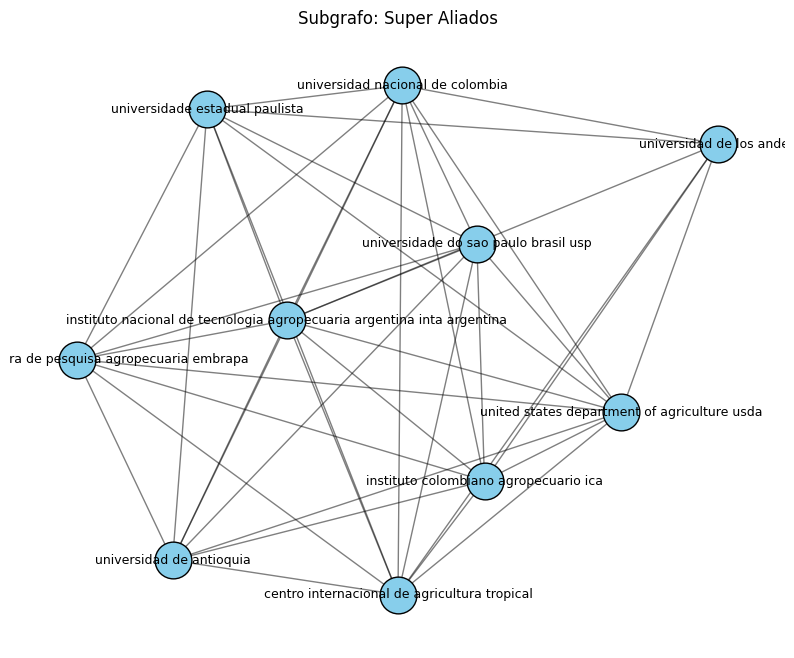

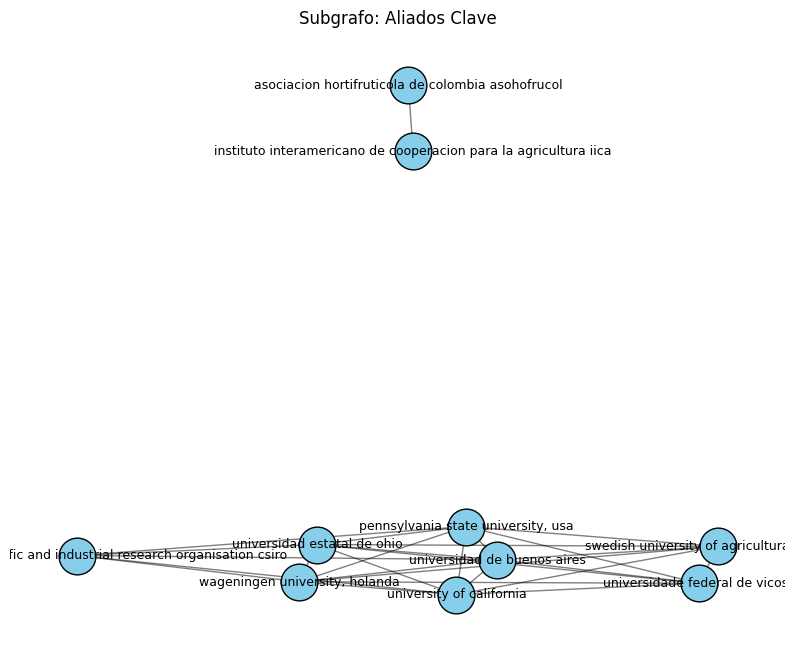

super_aliados.html
aliados_clave.html


(<IPython.core.display.HTML object>, <IPython.core.display.HTML object>)

In [47]:
# Se visualiza el subgrafo de superaliados
import matplotlib.pyplot as plt
from pyvis.network import Network
from IPython.display import HTML

# Se asignan nombres de institución como 'label' en los nodos del grafo
etiquetas_dict = df[['uniorg_id', 'uniorg_nombre']].drop_duplicates().set_index('uniorg_id')['uniorg_nombre'].to_dict()
nx.set_node_attributes(G_filtrado, etiquetas_dict, name='label')

# Se crea la función de visualización con matplotlib
def visualizar_subgrafo(G, lista_ids, nombre="Subgrafo"):
    subgrafo = G.subgraph(lista_ids)
    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(subgrafo, seed=42)
    nx.draw_networkx_nodes(subgrafo, pos, node_color='skyblue', node_size=700, edgecolors='black')
    nx.draw_networkx_edges(subgrafo, pos, alpha=0.5)

    etiquetas = {n: G.nodes[n].get('label', str(n)) for n in subgrafo.nodes()}
    nx.draw_networkx_labels(subgrafo, pos, labels=etiquetas, font_size=9)

    plt.title(nombre)
    plt.axis('off')
    plt.show()

# Se crea la función de visualización interactiva con PyVis
def visualizar_subgrafo_pyvis(G, lista_ids, nombre_html="subgrafo.html"):
    subgrafo = G.subgraph(lista_ids)
    net = Network(height="600px", width="100%", notebook=True, cdn_resources="in_line")
    net.from_nx(subgrafo)

    for n in net.nodes:
        label = G.nodes[n['id']].get('label') or G.nodes[n['id']].get('nombre') or str(n['id'])
        n['label'] = label

    net.show_buttons(filter_=['physics'])
    net.show(nombre_html)
    return HTML(nombre_html)

# Se obtienen los IDs desde los resultados anteriores
ids_super = top_super['uniorg_id'].tolist()
ids_clave = top_clave['uniorg_id'].tolist()

# Se llama a la visualización
visualizar_subgrafo(G_filtrado, ids_super, "Subgrafo: Super Aliados")
visualizar_subgrafo(G_filtrado, ids_clave, "Subgrafo: Aliados Clave")

html_super = visualizar_subgrafo_pyvis(G_filtrado, ids_super, "super_aliados.html")
html_clave = visualizar_subgrafo_pyvis(G_filtrado, ids_clave, "aliados_clave.html")

html_super, html_clave

In [48]:
# Se crea la visualización de cada una de los subgrafos de los superaliados y aliados clave

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from ipywidgets import interact, Dropdown, IntSlider
from IPython.display import display
import community as community_louvain

# Se cargan datos del dataset dataset

df['uniorg_id'] = df['uniorg_id'].astype(str).str.strip()
df['uniorg_nombre'] = df['uniorg_nombre'].astype(str).str.strip()
df['ali_fecini'] = pd.to_datetime(df['ali_fecini'], errors='coerce')
df['anio'] = df['ali_fecini'].dt.year

# Se crea el grafo
G_filtrado = nx.Graph()
for actores in df.groupby('ali_id')['uniorg_id'].unique():
    for i in range(len(actores)):
        for j in range(i + 1, len(actores)):
            G_filtrado.add_edge(actores[i], actores[j])

# Se asignan atributos al grafo
atributos_completos = df.groupby('uniorg_id').agg({
    'uniorg_nombre': 'first',
    'tipuniorg_desc': 'first',
    'tipali_desc': lambda x: list(x.dropna().unique()),
    'estacon_desc': lambda x: list(x.dropna().unique()),
    'ali_fecini': 'min'
}).dropna().copy()
atributos_completos['anio'] = atributos_completos['ali_fecini'].dt.year

for nodo in G_filtrado.nodes():
    if nodo in atributos_completos.index:
        G_filtrado.nodes[nodo]['label'] = atributos_completos.loc[nodo, 'uniorg_nombre']
        G_filtrado.nodes[nodo]['tipuniorg_desc'] = atributos_completos.loc[nodo, 'tipuniorg_desc']
        G_filtrado.nodes[nodo]['tipali_desc'] = atributos_completos.loc[nodo, 'tipali_desc']
        G_filtrado.nodes[nodo]['estacon_desc'] = atributos_completos.loc[nodo, 'estacon_desc']
        G_filtrado.nodes[nodo]['anio'] = atributos_completos.loc[nodo, 'anio']

# Se detectan las comunidades
partition = community_louvain.best_partition(G_filtrado)
nx.set_node_attributes(G_filtrado, partition, "comunidad")

# Se realiza la clasificación de aliados
def categorizar_aliados_por_grado(G, df):
    grados = dict(G.degree())
    df_grados = pd.DataFrame.from_dict(grados, orient='index', columns=['grado']).reset_index()
    df_grados = df_grados.rename(columns={'index': 'uniorg_id'})
    tipo_por_aliado = df.groupby('uniorg_id')['tipali_desc'].nunique()
    df_grados['num_tipos'] = df_grados['uniorg_id'].map(tipo_por_aliado)
    df_grados['nombre'] = df_grados['uniorg_id'].map(df.set_index('uniorg_id')['uniorg_nombre'].to_dict())
    top_super = df_grados[df_grados['num_tipos'] >= 3].sort_values(by='grado', ascending=False).head(10)
    top_clave = df_grados[df_grados['num_tipos'] == 2].sort_values(by='grado', ascending=False).head(10)
    return top_super, top_clave

top_super, top_clave = categorizar_aliados_por_grado(G_filtrado, df)
ids_super = top_super['uniorg_id'].tolist()
ids_clave = top_clave['uniorg_id'].tolist()

# Se crea la función de interfaz interactiva con filtros sobre vecinos
def interfaz_filtrado_mejorado(G, lista_ids, tipo_aliado):
    opciones = [(G.nodes[n]['label'], n) for n in lista_ids if 'label' in G.nodes[n]]
    anios = sorted(set(nx.get_node_attributes(G, 'anio').values()))
    tipos_alianza = sorted({v for l in nx.get_node_attributes(G, 'tipali_desc').values() for v in l})
    estados = sorted({v for l in nx.get_node_attributes(G, 'estacon_desc').values() for v in l})
    tipos_inst = sorted(set(nx.get_node_attributes(G, 'tipuniorg_desc').values()))
    comunidades = sorted(set(nx.get_node_attributes(G, 'comunidad').values()))

    @interact(
        aliado=Dropdown(options=opciones, description=f'{tipo_aliado}:'),
        grado_minimo=IntSlider(min=0, max=20, step=1, value=1, description="Grado ≥"),
        comunidad=Dropdown(options=[None] + comunidades, description="Comunidad"),
        anio=Dropdown(options=[None] + anios, description="Año inicio"),
        tipali=Dropdown(options=["Todos"] + tipos_alianza, description="Tipo Alianza"),
        estacon=Dropdown(options=["Todos"] + estados, description="Estado Alianza"),
        tipuniorg=Dropdown(options=["Todos"] + tipos_inst, description="Tipo Institución")
    )
    def visualizar(aliado, grado_minimo, comunidad, anio, tipali, estacon, tipuniorg):
        if G.degree(aliado) < grado_minimo:
            print(f"⚠️ El aliado no cumple con el grado mínimo ({G.degree(aliado)} < {grado_minimo})")
            return
        if comunidad is not None and G.nodes[aliado].get('comunidad') != comunidad:
            print(f"⚠️ El aliado no pertenece a la comunidad {comunidad}")
            return

        vecinos_validos = []
        for vecino in G.neighbors(aliado):
            n = G.nodes[vecino]
            cumple = True
            if anio and n.get('anio') != anio:
                cumple = False
            if tipali != "Todos" and tipali not in n.get('tipali_desc', []):
                cumple = False
            if estacon != "Todos" and estacon not in n.get('estacon_desc', []):
                cumple = False
            if tipuniorg != "Todos" and n.get('tipuniorg_desc') != tipuniorg:
                cumple = False
            if cumple:
                vecinos_validos.append(vecino)

        if not vecinos_validos:
            print("⚠️ No hay vecinos que cumplan los filtros seleccionados.")
            return

        subgrafo = G.subgraph([aliado] + vecinos_validos)
        etiquetas = {n: G.nodes[n].get('label', str(n)) for n in subgrafo.nodes()}
        plt.figure(figsize=(8, 6))
        pos = nx.spring_layout(subgrafo, seed=42)
        nx.draw_networkx_nodes(subgrafo, pos, node_color='lightblue', node_size=700, edgecolors='black')
        nx.draw_networkx_edges(subgrafo, pos, alpha=0.4)
        nx.draw_networkx_labels(subgrafo, pos, labels=etiquetas, font_size=8)
        plt.title(f"{tipo_aliado}: {etiquetas[aliado]}", fontsize=12)
        plt.axis('off')
        plt.tight_layout()
        plt.show()

# Se ejecutan las interfaces
interfaz_filtrado_mejorado(G_filtrado, ids_super, "Super Aliado")
interfaz_filtrado_mejorado(G_filtrado, ids_clave, "Aliado Clave")

interactive(children=(Dropdown(description='Super Aliado:', options=(('universidad nacional de colombia', '209…

interactive(children=(Dropdown(description='Aliado Clave:', options=(('instituto interamericano de cooperacion…

**7. Diseño y prueba de modelos predictivos para identificar nuevas colaboraciones.**

**Análisis de redes bipartitas, técnicas de Link Prediction y métodos de filtrado colaborativo adaptado**

**Funcionalidad para recomendar aliados para nuevos proyectos por Score**

In [49]:
# Se cargan librerías necesarias
import pandas as pd
import networkx as nx
import ipywidgets as widgets
from IPython.display import display, clear_output

# Se carga el dataset
df = df.dropna(subset=['ali_id', 'uniorg_id', 'uniorg_nombre'])
df['ali_id'] = df['ali_id'].astype(str)
df['uniorg_id'] = df['uniorg_id'].astype(str)

# Se construye la matriz bipartita Proyecto x Institución
bipartita = pd.crosstab(df['ali_id'], df['uniorg_id'])

# Se crea el diccionario {nombre: id}
nombre_to_id = df[['uniorg_id', 'uniorg_nombre']].drop_duplicates()
nombre_to_id_dict = dict(zip(nombre_to_id['uniorg_nombre'], nombre_to_id['uniorg_id']))

# Se crea widget para seleccionar aliados por nombre
selector_nombres = widgets.SelectMultiple(
    options=sorted(nombre_to_id_dict.keys()),
    description='Selecciona aliados:',
    layout=widgets.Layout(width='50%', height='150px'),
    style={'description_width': 'initial'}
)

boton_recomendar = widgets.Button(description='Recomendar aliados')
salida = widgets.Output()

# Función para generar recomendaciones
def recomendar_para_proyecto_nuevo(ids_aliados, top_k=10):
    aliados_validos = [a for a in ids_aliados if a in bipartita.columns]
    if not aliados_validos:
        raise ValueError("Ninguno de los aliados seleccionados está en el dataset.")

    # Proyectos donde han participado los aliados base
    proyectos_similares = bipartita[aliados_validos].sum(axis=1)
    proyectos_similares = proyectos_similares[proyectos_similares > 0].index

    # Instituciones participantes en esos proyectos
    recomendables = bipartita.loc[proyectos_similares].sum()
    recomendables = recomendables[~recomendables.index.isin(aliados_validos)]
    recomendables = recomendables[recomendables > 0]  # Solo score > 0

    recomendados = recomendables.sort_values(ascending=False).head(top_k)
    resultado = recomendados.reset_index().rename(columns={'uniorg_id': 'institucion', 0: 'score'})
    resultado['nombre'] = resultado['institucion'].map({v: k for k, v in nombre_to_id_dict.items()})

    # Añadir columna con lista de proyectos compartidos
    proyectos_dict = {}
    for inst in resultado['institucion']:
        proyectos_inst = df[df['uniorg_id'] == inst]['ali_id'].unique()
        proyectos_compartidos = df[df['uniorg_id'].isin(aliados_validos)]['ali_id'].unique()
        interseccion = list(set(proyectos_inst).intersection(set(proyectos_compartidos)))
        proyectos_dict[inst] = ", ".join(interseccion)

    resultado['proyectos_compartidos'] = resultado['institucion'].map(proyectos_dict)
    return resultado[['nombre', 'institucion', 'score', 'proyectos_compartidos']]


# Se crea función al hacer clic en Aliado
def on_click_recomendar(b):
    with salida:
        clear_output()
        seleccionados = list(selector_nombres.value)
        ids = [nombre_to_id_dict[nombre] for nombre in seleccionados]
        try:
            resultado = recomendar_para_proyecto_nuevo(ids)
            display(resultado)
        except Exception as e:
            print("Error:", e)

boton_recomendar.on_click(on_click_recomendar)

# Se muestra la interfaz
display(widgets.VBox([selector_nombres, boton_recomendar, salida]))

**Funcionalidad para recomendar aliados para nuevos proyectos por métricas**

In [50]:
# Se crea la función para recomendar por métricas
def recomendar_con_metricas(aliados_base, metodo='cosine', top_k=10, peso_aa=0.5, peso_cos=0.5):
    aliados_validos = [a for a in aliados_base if a in bipartita.columns]
    if not aliados_validos:
        raise ValueError("Aliados no válidos")

    # se obtienen Proyectos similares
    proyectos_similares = bipartita[aliados_validos].sum(axis=1)
    proyectos_similares = proyectos_similares[proyectos_similares > 0].index

    # Se calcula Cosine similarity
    cos_sim = cosine_similarity(bipartita.T)
    sim_df = pd.DataFrame(cos_sim, index=bipartita.columns, columns=bipartita.columns)

    # Se calcula Adamic-Adar
    instituciones = bipartita.columns.tolist()
    G_proj = nx.bipartite.weighted_projected_graph(B, instituciones)
    pares = [(a, b) for a in aliados_validos for b in instituciones if a != b and not G_proj.has_edge(a, b)]
    aa_scores = list(nx.adamic_adar_index(G_proj, pares))
    df_aa = pd.DataFrame(aa_scores, columns=['a', 'b', 'score'])

    # Se calculan puntajes
    puntajes = {}
    for candidato in instituciones:
        if candidato in aliados_validos:
            continue

        score_cos = sim_df.loc[aliados_validos, candidato].sum() if candidato in sim_df else 0
        score_aa = df_aa[df_aa['b'] == candidato]['score'].sum() if candidato in df_aa['b'].values else 0

        if metodo == 'cosine':
            puntaje = score_cos
        elif metodo == 'adamic_adar':
            puntaje = score_aa
        elif metodo == 'mixta':
            puntaje = peso_aa * score_aa + peso_cos * score_cos
        else:
            raise ValueError("Método no reconocido")

        if puntaje > 0:
            puntajes[candidato] = puntaje

    # Se ordenan y preparan los resultados
    resultado = pd.Series(puntajes).sort_values(ascending=False).head(top_k)
    resultado = resultado.reset_index().rename(columns={'index': 'institucion', 0: 'score'})
    resultado['nombre'] = resultado['institucion'].map({v: k for k, v in nombre_to_id_dict.items()})

    # Se obtienen alianzas compartidas
    proyectos_dict = {}
    for inst in resultado['institucion']:
        proyectos_inst = df[df['uniorg_id'] == inst]['ali_id'].unique()
        proyectos_compartidos = df[df['uniorg_id'].isin(aliados_validos)]['ali_id'].unique()
        interseccion = list(set(proyectos_inst).intersection(set(proyectos_compartidos)))
        proyectos_dict[inst] = ", ".join(interseccion)

    resultado['proyectos_compartidos'] = resultado['institucion'].map(proyectos_dict)
    return resultado[['nombre', 'institucion', 'score', 'proyectos_compartidos']]

In [51]:
df = df.dropna(subset=['ali_id', 'uniorg_id', 'uniorg_nombre'])
df['ali_id'] = df['ali_id'].astype(str)
df['uniorg_id'] = df['uniorg_id'].astype(str)

# Se crea la matriz bipartita
bipartita = pd.crosstab(df['ali_id'], df['uniorg_id'])

# Se crea diccionario nombre -> id
nombre_to_id_dict = dict(zip(df['uniorg_nombre'], df['uniorg_id']))

# Se genera la red bipartita y proyectada
B = nx.Graph()
B.add_nodes_from(bipartita.index, bipartite=0)
B.add_nodes_from(bipartita.columns, bipartite=1)
for proyecto in bipartita.index:
    for inst in bipartita.columns[bipartita.loc[proyecto] > 0]:
        B.add_edge(proyecto, inst)

G_proj = nx.bipartite.weighted_projected_graph(B, bipartita.columns.tolist())

# Función de recomendación
def recomendar_con_metricas(aliados_base, metodo='cosine', top_k=10, peso_aa=0.5, peso_cos=0.5):
    aliados_validos = [a for a in aliados_base if a in bipartita.columns]
    if not aliados_validos:
        raise ValueError("Aliados no válidos")

    proyectos_similares = bipartita[aliados_validos].sum(axis=1)
    proyectos_similares = proyectos_similares[proyectos_similares > 0].index

    cos_sim = cosine_similarity(bipartita.T)
    sim_df = pd.DataFrame(cos_sim, index=bipartita.columns, columns=bipartita.columns)

    pares = [(a, b) for a in aliados_validos for b in bipartita.columns if a != b and not G_proj.has_edge(a, b)]
    aa_scores = list(nx.adamic_adar_index(G_proj, pares))
    df_aa = pd.DataFrame(aa_scores, columns=['a', 'b', 'score'])

    puntajes = {}
    for candidato in bipartita.columns:
        if candidato in aliados_validos:
            continue
        score_cos = sim_df.loc[aliados_validos, candidato].sum() if candidato in sim_df else 0
        score_aa = df_aa[df_aa['b'] == candidato]['score'].sum() if candidato in df_aa['b'].values else 0
        if metodo == 'cosine':
            puntaje = score_cos
        elif metodo == 'adamic_adar':
            puntaje = score_aa
        elif metodo == 'mixta':
            puntaje = peso_aa * score_aa + peso_cos * score_cos
        else:
            puntaje = 0
        if puntaje > 0:
            puntajes[candidato] = puntaje

    resultado = pd.Series(puntajes).sort_values(ascending=False).head(top_k)
    resultado = resultado.reset_index().rename(columns={'index': 'institucion', 0: 'score'})
    resultado['nombre'] = resultado['institucion'].map({v: k for k, v in nombre_to_id_dict.items()})

    proyectos_dict = {}
    for inst in resultado['institucion']:
        proyectos_inst = df[df['uniorg_id'] == inst]['ali_id'].unique()
        proyectos_compartidos = df[df['uniorg_id'].isin(aliados_validos)]['ali_id'].unique()
        interseccion = list(set(proyectos_inst).intersection(set(proyectos_compartidos)))
        proyectos_dict[inst] = ", ".join(interseccion)

    resultado['proyectos_compartidos'] = resultado['institucion'].map(proyectos_dict)
    return resultado[['nombre', 'institucion', 'score', 'proyectos_compartidos']]

# Se crean los Widgets
selector_nombres = widgets.SelectMultiple(
    options=sorted(nombre_to_id_dict.keys()),
    description='Aliados conocidos:',
    layout=widgets.Layout(width='60%', height='150px')
)

selector_metodo = widgets.Dropdown(
    options=[('Similitud coseno', 'cosine'), ('Adamic-Adar', 'adamic_adar'), ('Combinado (70% AA + 30% Cos)', 'mixta')],
    value='cosine',
    description='Método de recomendación:',
    style={'description_width': 'initial'}
)

boton = widgets.Button(description='Recomendar aliados')
salida = widgets.Output()

# Función al hacer clic
def on_click_recomendar(b):
    with salida:
        clear_output()
        seleccionados = list(selector_nombres.value)
        ids = [nombre_to_id_dict[n] for n in seleccionados]
        metodo = selector_metodo.value
        pesos = (0.7, 0.3) if metodo == 'mixta' else (1, 0)
        try:
            resultado = recomendar_con_metricas(ids, metodo=metodo, peso_aa=pesos[0], peso_cos=pesos[1])
            display(resultado)
        except Exception as e:
            print("Error:", e)

boton.on_click(on_click_recomendar)

# Se muestra la interfaz
display(widgets.VBox([selector_nombres, selector_metodo, boton, salida]))

**Modelo Predictivo Basado en Características Estructurales de Redes**

In [52]:
from itertools import combinations
import random
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, classification_report
from sklearn.preprocessing import MinMaxScaler

# Se cargan los archivos de nodos y aristas
nodos = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/nodos_red_colaboracion_coactores.csv")
aristas = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/aristas_red_colaboracion_coactores.csv")

# Se construye el grafo real
G = nx.Graph()

for _, row in nodos.iterrows():
    G.add_node(str(row['node_id']), label=row['label'], tipo=row['tipo'], pais=row['pais'])

for _, row in aristas.iterrows():
    G.add_edge(str(row['source']), str(row['target']), weight=row['weight'])

# Se generan pares positivos (enlaces existentes) y negativos (no existentes)
positivos = list(G.edges())
nodos_lista = list(G.nodes())
negativos = []

while len(negativos) < len(positivos):
    u, v = random.sample(nodos_lista, 2)
    if not G.has_edge(u, v) and (u, v) not in negativos and (v, u) not in negativos:
        negativos.append((u, v))

# Se crea el dataset combinado
df_pos = pd.DataFrame(positivos, columns=['n1', 'n2'])
df_pos['link'] = 1
df_neg = pd.DataFrame(negativos, columns=['n1', 'n2'])
df_neg['link'] = 0
df_all = pd.concat([df_pos, df_neg], ignore_index=True)

# Se calculan características estructurales
def compute_features(g, df):
    df_feat = df.copy()
    df_feat['common_neighbors'] = [len(list(nx.common_neighbors(g, u, v))) for u, v in zip(df['n1'], df['n2'])]
    df_feat['jaccard'] = [list(nx.jaccard_coefficient(g, [(u, v)]))[0][2] if g.has_node(u) and g.has_node(v) else 0 for u, v in zip(df['n1'], df['n2'])]
    df_feat['preferential_attachment'] = [list(nx.preferential_attachment(g, [(u, v)]))[0][2] if g.has_node(u) and g.has_node(v) else 0 for u, v in zip(df['n1'], df['n2'])]
    df_feat['adamic_adar'] = [list(nx.adamic_adar_index(g, [(u, v)]))[0][2] if g.has_node(u) and g.has_node(v) else 0 for u, v in zip(df['n1'], df['n2'])]
    return df_feat

df_features = compute_features(G, df_all)

# Se preparan datos para modelado
X = df_features[['common_neighbors', 'jaccard', 'preferential_attachment', 'adamic_adar']]
y = df_features['link']
X_scaled = MinMaxScaler().fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Se entrena el modelo
modelo = LogisticRegression()
modelo.fit(X_train, y_train)

# Se evalua el modelo
y_pred = modelo.predict(X_test)
y_proba = modelo.predict_proba(X_test)[:, 1]
auc = roc_auc_score(y_test, y_proba)
print("=== Evaluación del Modelo Predictivo ===")
print(f"AUC-ROC: {auc:.4f}")
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred))

# Se exportan las predicciones
df_features['pred_proba'] = modelo.predict_proba(X_scaled)[:, 1]
df_resultado = df_features[['n1', 'n2', 'pred_proba']].sort_values(by='pred_proba', ascending=False)
df_resultado.to_csv("predicciones_colaboraciones.csv", index=False)

=== Evaluación del Modelo Predictivo ===
AUC-ROC: 0.9827

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.87      0.97      0.92      2028
           1       0.97      0.85      0.91      2029

    accuracy                           0.91      4057
   macro avg       0.92      0.91      0.91      4057
weighted avg       0.92      0.91      0.91      4057



In [53]:
# Se cargan nombres desde el archivo de nodos
nodos = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/nodos_red_colaboracion_coactores.csv")
id_to_nombre = nodos.set_index('node_id')['label'].to_dict()

# Se asegura que node_id es string
nodos['node_id'] = nodos['node_id'].astype(str)

# Se crea el diccionario de mapeo
id_to_nombre = nodos.set_index('node_id')['label'].to_dict()

# Se asegura que n1 y n2 también sean string
df_resultado['n1'] = df_resultado['n1'].astype(str)
df_resultado['n2'] = df_resultado['n2'].astype(str)

# Se mapean los nombres
df_resultado['nombre_1'] = df_resultado['n1'].map(id_to_nombre)
df_resultado['nombre_2'] = df_resultado['n2'].map(id_to_nombre)

pd.set_option('display.float_format', lambda x: f'{x:.6f}')

# Se visualizar top 10 de predicciones
df_resultado[['nombre_1', 'nombre_2', 'pred_proba']].head(10)

,nombre_1,nombre_2,pred_proba
302,centro internacional de agricultura tropical,universidad nacional de colombia,1.000000
763,universidad de antioquia,universidad nacional de colombia,1.000000
5154,universidad agraria la molina - unalm,university of yucatan - uady,1.000000
2677,"pennsylvania state university, usa",university of yucatan - uady,1.000000
5245,universidad federal de parana ufpr,university of yucatan - uady,1.000000
2667,"pennsylvania state university, usa",universidad agraria la molina - unalm,1.000000
5146,universidad agraria la molina - unalm,universidad federal de parana ufpr,1.000000
2670,"pennsylvania state university, usa",universidad federal de parana ufpr,1.000000
4109,universidad estatal de ohio,university of yucatan - uady,1.000000
3430,universidade federal do rio grande do sul,university of yucatan - uady,1.000000
